In [75]:
import pandas as pd

# Read the CSV file
nifty50_data = pd.read_csv("C:\\Users\\kkala\\Downloads\\nifty50_closing_prices (1).csv")
print(nifty50_data.head())  # Display the first few rows

                        Date  RELIANCE.NS  HDFCBANK.NS  ICICIBANK.NS  \
0  2024-08-20 00:00:00+05:30  2991.899902  1637.699951   1179.449951   
1  2024-08-21 00:00:00+05:30  2997.350098  1625.800049   1174.849976   
2  2024-08-22 00:00:00+05:30  2996.250000  1631.300049   1191.099976   
3  2024-08-23 00:00:00+05:30  2999.949951  1625.050049   1203.500000   
4  2024-08-26 00:00:00+05:30  3025.199951  1639.949951   1213.300049   

       INFY.NS       TCS.NS  KOTAKBANK.NS  HINDUNILVR.NS      ITC.NS  \
0  1872.199951  4523.299805   1805.650024    2751.050049  498.799988   
1  1872.699951  4551.500000   1812.949951    2791.199951  505.399994   
2  1880.250000  4502.000000   1821.500000    2792.800049  504.549988   
3  1862.099976  4463.899902   1818.000000    2815.600098  505.799988   
4  1876.150024  4502.450195   1812.500000    2821.149902  505.700012   

         LT.NS  ...  HEROMOTOCO.NS   DRREDDY.NS   SHREECEM.NS  BRITANNIA.NS  \
0  3572.699951  ...    5244.399902  6965.350098  24730.

In [77]:
#checking for missing values
missing_values=nifty50_data.isnull().sum()

#check for date column format
date_format_check = pd.to_datetime(nifty50_data['Date'] , errors='coerce').notna().all()

#check if the data has sufficient rows for time-series analysis
sufficient_rows = nifty50_data.shape[0]>=20

#preparing a summary of the checks
data_preparation_summary = {"Missing values in column": missing_values[missing_values>0],
                            "Date column format valid": date_format_check,
                            "Sufficient rows for Time-Series analysis": sufficient_rows}
data_preparation_summary

{'Missing values in column': HDFC.NS    24
 dtype: int64,
 'Date column format valid': True,
 'Sufficient rows for Time-Series analysis': True}

In [79]:
#drop the HDFC.NS column since it has missing values
nifty50_data=nifty50_data.drop(columns=['HDFC.NS'])

#Convert the 'Date' column to datetime format
nifty50_data['Date']=pd.to_datetime(nifty50_data['Date'])

#sort the dataset by date to ensure proper time-series order
nifty50_data = nifty50_data.sort_values(by='Date')

#reset index for a clean dataframe
nifty50_data.reset_index(drop=True,inplace=True)
print(nifty50_data.head())

                       Date  RELIANCE.NS  HDFCBANK.NS  ICICIBANK.NS  \
0 2024-08-20 00:00:00+05:30  2991.899902  1637.699951   1179.449951   
1 2024-08-21 00:00:00+05:30  2997.350098  1625.800049   1174.849976   
2 2024-08-22 00:00:00+05:30  2996.250000  1631.300049   1191.099976   
3 2024-08-23 00:00:00+05:30  2999.949951  1625.050049   1203.500000   
4 2024-08-26 00:00:00+05:30  3025.199951  1639.949951   1213.300049   

       INFY.NS       TCS.NS  KOTAKBANK.NS  HINDUNILVR.NS      ITC.NS  \
0  1872.199951  4523.299805   1805.650024    2751.050049  498.799988   
1  1872.699951  4551.500000   1812.949951    2791.199951  505.399994   
2  1880.250000  4502.000000   1821.500000    2792.800049  504.549988   
3  1862.099976  4463.899902   1818.000000    2815.600098  505.799988   
4  1876.150024  4502.450195   1812.500000    2821.149902  505.700012   

         LT.NS  ...  HEROMOTOCO.NS   DRREDDY.NS   SHREECEM.NS  BRITANNIA.NS  \
0  3572.699951  ...    5244.399902  6965.350098  24730.550781

Descriptive Statistics

In [82]:
descriptive_stats = nifty50_data.describe().T  # Transpose for better readability
descriptive_stats = descriptive_stats[['mean', 'std', 'min', 'max']]
descriptive_stats.columns = ['Mean', 'Std Dev', 'Min', 'Max']
print(descriptive_stats.head())

                     Mean    Std Dev          Min          Max
RELIANCE.NS   2976.912506  41.290551  2903.000000  3041.850098
HDFCBANK.NS   1652.339579  28.258220  1625.050049  1741.199951
ICICIBANK.NS  1236.770818  36.438726  1174.849976  1338.449951
INFY.NS       1914.558324  30.240685  1862.099976  1964.500000
TCS.NS        4478.349976  70.822718  4284.899902  4553.750000


PORTFOLIO ANALYSIS

In [85]:
#assign weights to sa subset of stocks
weights = [0.4,0.35,0.25]
portfolio_data = nifty50_data[['RELIANCE.NS','SBIN.NS','TATAMOTORS.NS']]

#calculate daily returns
daily_returns = portfolio_data.pct_change()

#calculate portfolio returns
portfolio_returns = (daily_returns * weights).sum(axis=1)
portfolio_returns


0     0.000000
1    -0.001689
2    -0.001967
3     0.002289
4     0.004908
5    -0.006315
6    -0.003988
7     0.019204
8    -0.004795
9     0.000360
10   -0.002479
11   -0.003155
12   -0.007348
13   -0.027668
14   -0.002403
15   -0.001665
16   -0.023388
17    0.019042
18    0.000946
19   -0.003624
20   -0.004324
21   -0.001309
22    0.001752
23    0.001763
dtype: float64

RISK ASSESSEMENT

In [88]:
#Calculate standard deviation(volatility)
volatility = daily_returns.std()

#Calculate VaR(95% confidence level)
confidence_level = 0.05
VaR = daily_returns.quantile(confidence_level)

#Display risk metrics
risk_metrics = pd.DataFrame({'Volatility' : volatility,'Value at Risk' : VaR}) 
risk_metrics

,Volatility,Value at Risk
RELIANCE.NS,0.008708,-0.013624
SBIN.NS,0.012729,-0.017201
TATAMOTORS.NS,0.017816,-0.018350


CORRELATION ANALYSIS

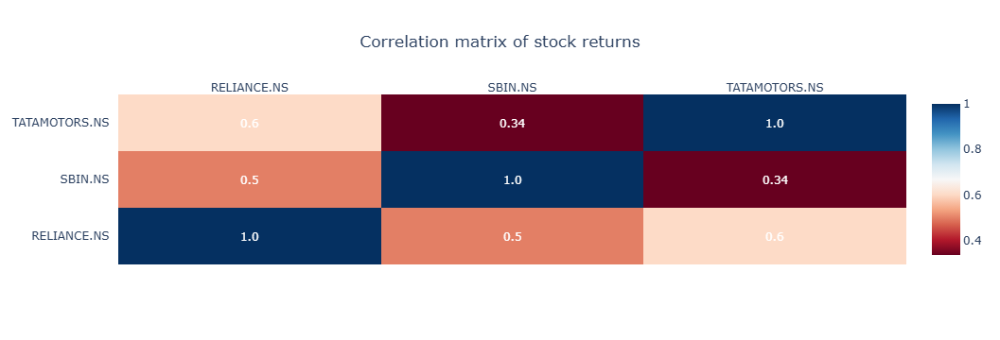

In [91]:
import plotly.figure_factory as ff

#calculate correlation matix
correlation_matrix = daily_returns.corr()

#calculate correlartion matrix
fig = ff.create_annotated_heatmap(
    z=correlation_matrix.values,
    x=list(correlation_matrix.columns),
    y=list(correlation_matrix.index),
    annotation_text=correlation_matrix.round(2).values,
    colorscale='RdBu',
    showscale=True
)

fig.update_layout(
    title="Correlation matrix of stock returns",
    title_x=0.5,
    font=dict(size=12),
    plot_bgcolor='white',
    paper_bgcolor='white'
)
fig.show()
    

MOVING AVERAGES

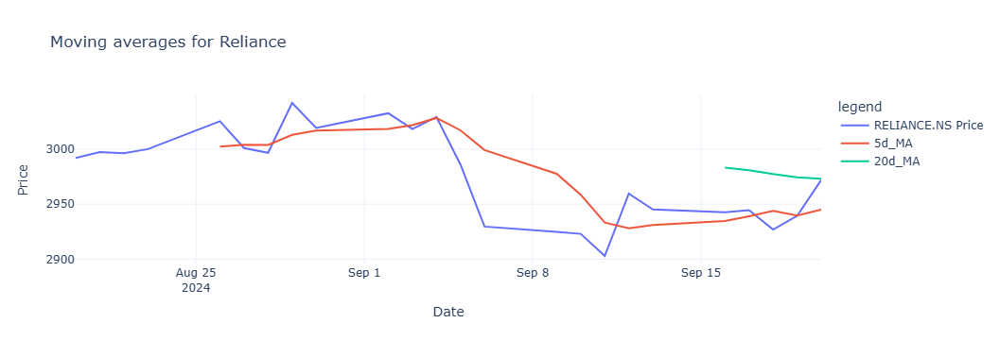

In [94]:
import plotly.graph_objects as go

#calculating moving averages for reliance
nifty50_data['RELIANCE_5d_MA'] = nifty50_data['RELIANCE.NS'].rolling(window=5).mean()
nifty50_data['RELIANCE_20d_MA'] = nifty50_data['RELIANCE.NS'].rolling(window=20).mean()

fig = go.Figure()

fig.add_trace(go.Scatter(
    x=nifty50_data['Date'],
    y=nifty50_data['RELIANCE.NS'],
    mode='lines',
    name='RELIANCE.NS Price'
))

fig.add_trace(go.Scatter(
    x=nifty50_data['Date'],
    y=nifty50_data['RELIANCE_5d_MA'],
    mode='lines',
    name='5d_MA'
))

fig.add_trace(go.Scatter(
    x=nifty50_data['Date'],
    y=nifty50_data['RELIANCE_20d_MA'],
    mode='lines',
    name='20d_MA'
))

fig.update_layout(
    title = "Moving averages for Reliance",
    xaxis_title = "Date",
    yaxis_title = "Price",
    template = "plotly_white",
    legend=dict(title="legend")
)

fig.show()

              
     

RELATIVE STRENGTH INDEX(RSI)

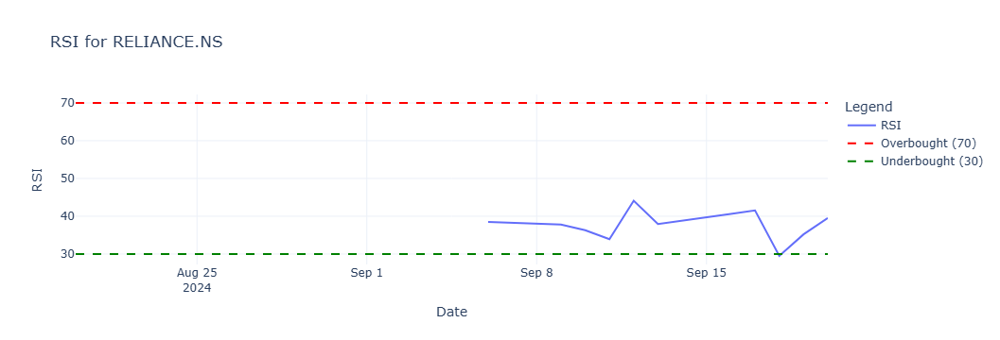

In [97]:
#RSI Calculation
def calculate_rsi(prices,window=14):
    delta = prices.diff()
    gain = (delta.where(delta>0,0)).rolling(window=window).mean()
    loss = (-delta.where(delta<0,0)).rolling(window=window).mean()
    rs = gain/loss
    rsi = 100 - (100/(1+rs))
    return rsi

#calculate rsi for reliance
nifty50_data['Reliance_RSI'] = calculate_rsi(nifty50_data['RELIANCE.NS'])

fig=go.Figure()

fig.add_trace(go.Scatter(
    x=nifty50_data['Date'],
    y=nifty50_data['Reliance_RSI'],
    mode='lines',
    name='RSI'
))

fig.add_trace(go.Scatter(
    x=nifty50_data['Date'],
    y=[70] * len(nifty50_data['Date']),
    mode='lines',
    line=dict(color='red',dash='dash'),
    name='Overbought (70)'
))

fig.add_trace(go.Scatter(
    x=nifty50_data['Date'],
    y=[30] * len(nifty50_data['Date']),
    mode='lines',
    line=dict(color='green',dash='dash'),
    name='Underbought (30)'
))

fig.update_layout(
    title='RSI for RELIANCE.NS',
    xaxis_title='Date',
    yaxis_title='RSI',
    template='plotly_white',
    legend=dict(title='Legend')
)

fig.show()
    

SHARPE RATIO

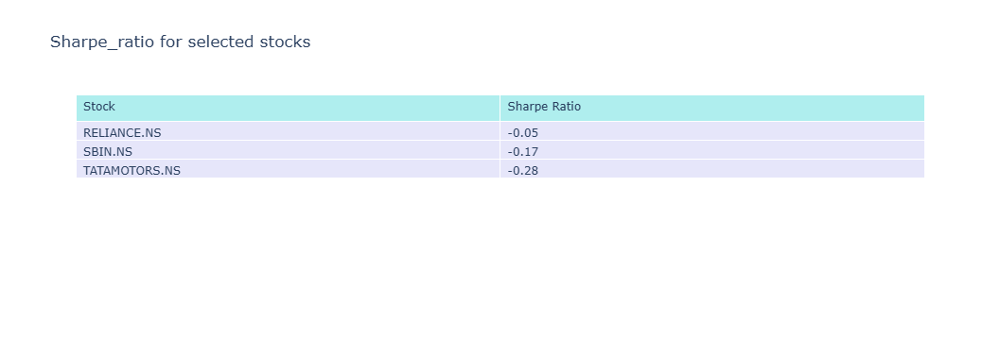

In [100]:
import numpy as np

#calculate average returns and volatility
mean_returns = daily_returns.mean()
volatility = daily_returns.std()

#assume a risk free rate
risk_free_rate = 0.04/252

#calculate sharp ratio
sharpe_ratio = (mean_returns-risk_free_rate)/volatility

table_data = pd.DataFrame({
    'Stock' : sharpe_ratio.index,
    'Sharpe_ratio' : sharpe_ratio.values.round(2)
})

fig = go.Figure(data=[go.Table(
    header=dict(values=['Stock', 'Sharpe Ratio'],
                fill_color='paleturquoise',
                align='left'),
    cells=dict(values=[table_data['Stock'], table_data['Sharpe_ratio']],
               fill_color='lavender',
               align='left')
)])

fig.update_layout(
    title='Sharpe_ratio for selected stocks',
    template='plotly_white'
)

fig.show()

MONTE CARLO

In [103]:
num_simulations = 1000
num_days = 150
last_price = nifty50_data['RELIANCE.NS'].iloc[-1]
simulated_prices = np.zeros((num_simulations,num_days))
volatility = nifty50_data['RELIANCE.NS'].pct_change().std()

for i in range(num_simulations):
    simulated_prices[i,0] = last_price
    for j in range(1,num_days):
        simulated_prices[i,j]=simulated_prices[i,j-1]*np.exp(
            np.random.normal(0,volatility)
        )

fig=go.Figure()

for i in range(num_simulations):
    fig.add_trace(go.Scatter(
        x=list(range(num_days)),
        y=simulated_prices[i],
        mode='lines',
        line=dict(width=0.5),
        opacity=0.1,
        showlegend=False
    ))

fig.update_layout(
    title='Monte Carlo Simulation',
    xaxis_title='Days',
    yaxis_title='Simulated_Prices',
    template='plotly_white'
)

fig.show()
    
    

PRICE CHART

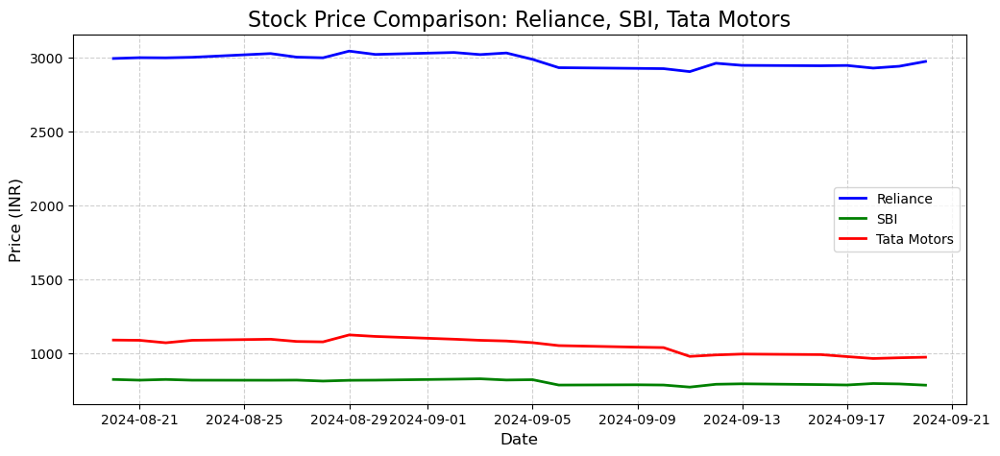

In [105]:
import matplotlib.pyplot as plt

# Convert 'Date' to datetime for proper plotting
nifty50_data['Date'] = pd.to_datetime(nifty50_data['Date'])

# Filter the relevant columns
selected_data = nifty50_data[['Date', 'RELIANCE.NS', 'SBIN.NS', 'TATAMOTORS.NS']]

# Plot the data
plt.figure(figsize=(12, 5))

plt.plot(selected_data['Date'], selected_data['RELIANCE.NS'], label='Reliance', color='blue', linewidth=2)
plt.plot(selected_data['Date'], selected_data['SBIN.NS'], label='SBI', color='green', linewidth=2)
plt.plot(selected_data['Date'], selected_data['TATAMOTORS.NS'], label='Tata Motors', color='red', linewidth=2)

# Add chart details
plt.title("Stock Price Comparison: Reliance, SBI, Tata Motors", fontsize=16)
plt.xlabel("Date", fontsize=12)
plt.ylabel("Price (INR)", fontsize=12)
plt.legend()
plt.grid(True, linestyle="--", alpha=0.6)

# Display the chart
plt.show()


In [106]:
import pandas as pd

# Rename the first column to 'Date' and convert it to a proper datetime format
nifty50_data.rename(columns={nifty50_data.columns[0]: "Date"}, inplace=True)
nifty50_data["Date"] = pd.to_datetime(nifty50_data["Date"])

# Filter only the column for Reliance (e.g., 'RELIANCE')
# Replace 'RELIANCE' with the exact ticker for Reliance in your dataset
reliance_data = nifty50_data[["Date", "RELIANCE.NS"]].dropna()

# Sort by Date (if not already sorted)
reliance_data = reliance_data.sort_values(by="Date")

# Calculate ROI
# Use the first and last closing prices
initial_price = reliance_data["RELIANCE.NS"].iloc[0]
final_price = reliance_data["RELIANCE.NS"].iloc[-1]
roi = ((final_price - initial_price) / initial_price) * 100

# Print the results
print(f"Initial Price of Reliance: {initial_price}")
print(f"Final Price of Reliance: {final_price}")
print(f"ROI for Reliance over the period: {roi:.2f}%")


Initial Price of Reliance: 2991.89990234375
Final Price of Reliance: 2971.85009765625
ROI for Reliance over the period: -0.67%
